In [ ]:
from numba import njit, prange, jit
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.spatial as spatial
import shapely
import shapely.ops
import shapely.geometry
import shapely.affinity

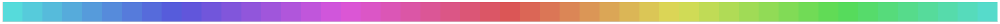

In [ ]:

sns.set(font='serif',
        rc={
 'axes.axisbelow': False,
 'axes.edgecolor': 'lightgrey',
 'axes.facecolor': 'None',
 'axes.labelcolor': 'dimgrey',
 'axes.spines.right': False,
 'axes.spines.top': False,
 'axes.grid':False,
 'figure.facecolor': 'white',
 'lines.solid_capstyle': 'round',
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'text.color': 'dimgrey',
 'xtick.bottom': False,
 'xtick.color': 'dimgrey',
 'xtick.direction': 'out',
 'xtick.top': False,
 'ytick.color': 'dimgrey',
 'ytick.direction': 'out',
 'ytick.left': False,
 'ytick.right': False})
sns.set_context("notebook", rc={"font.size":16,
                                "axes.titlesize":20,
                                "axes.labelsize":18})
plt.rcParams["figure.figsize"] = (18,18)

colors = sns.hls_palette(50, h=0.5)
sns.palplot(colors)
sns.set_palette(colors)

In [ ]:

N = 100
n_movs = 1000

@njit(parallel=True)
def random_walk_p(N, n_movs, obj_pos, start = None):
  if start is None:
    start= np.array((0,0))

  movs = np.array(((-1,0),(1,0),(0,1),(0,-1)))
  paths = np.zeros((N,n_movs,movs[0].size))
  obj_found = np.zeros((N))
  came_back = np.zeros((N))
  distances = np.zeros((N))
  for i in prange(N):
    current = np.zeros(( n_movs, movs[0].size))
    pos = np.array((0,0))
    choices = np.random.randint(0, movs.shape[0], n_movs )
    for m in range(n_movs):

      pos = pos+movs[choices[m]]
      movs[0].size
      current[m] = pos
      if (pos == obj_pos).all():
        obj_found[i] = 1

    paths[i] = current
    distances[i] = np.linalg.norm(current[0] - current[-1])

  return obj_found, came_back, distances, paths

@njit()
def random_walk(N, n_movs, obj_pos, start = None):
  if start is None:
    start= np.array((0,0))

  movs = np.array(((-1,0),(1,0),(0,1),(0,-1)))
  paths = np.zeros((N,n_movs,movs[0].size))
  obj_found = np.zeros((N))
  came_back = np.zeros((N))
  distances = np.zeros((N))
  for i in range(N):
    current = np.zeros(( n_movs, movs[0].size))
    pos = np.array((0,0))
    choices = np.random.randint(0, movs.shape[0], n_movs )
    for m in range(n_movs):

      pos = pos+movs[choices[m]]
      movs[0].size
      current[m] = pos
      if (pos == obj_pos).all():
        obj_found[i] = 1
      if (pos == start).all() and obj_found[i]:
        came_back[i] = 1
    paths[i] = current
    distances[i] = np.linalg.norm(current[0] - current[-1])

  return obj_found, came_back, distances, paths


In [ ]:
def plot_paths(paths,n=50):
  for i in range(n):
    plt.plot(paths[n][:,0], paths[n][:,1])
def plot_hist(distances):
  plt.hist(distances)


In [ ]:
n_movs = 10000
N = 2000
obj = np.array((30,30))
start = np.array((0,0))
obj_found, came_back, distances, paths = random_walk(N, n_movs, obj)

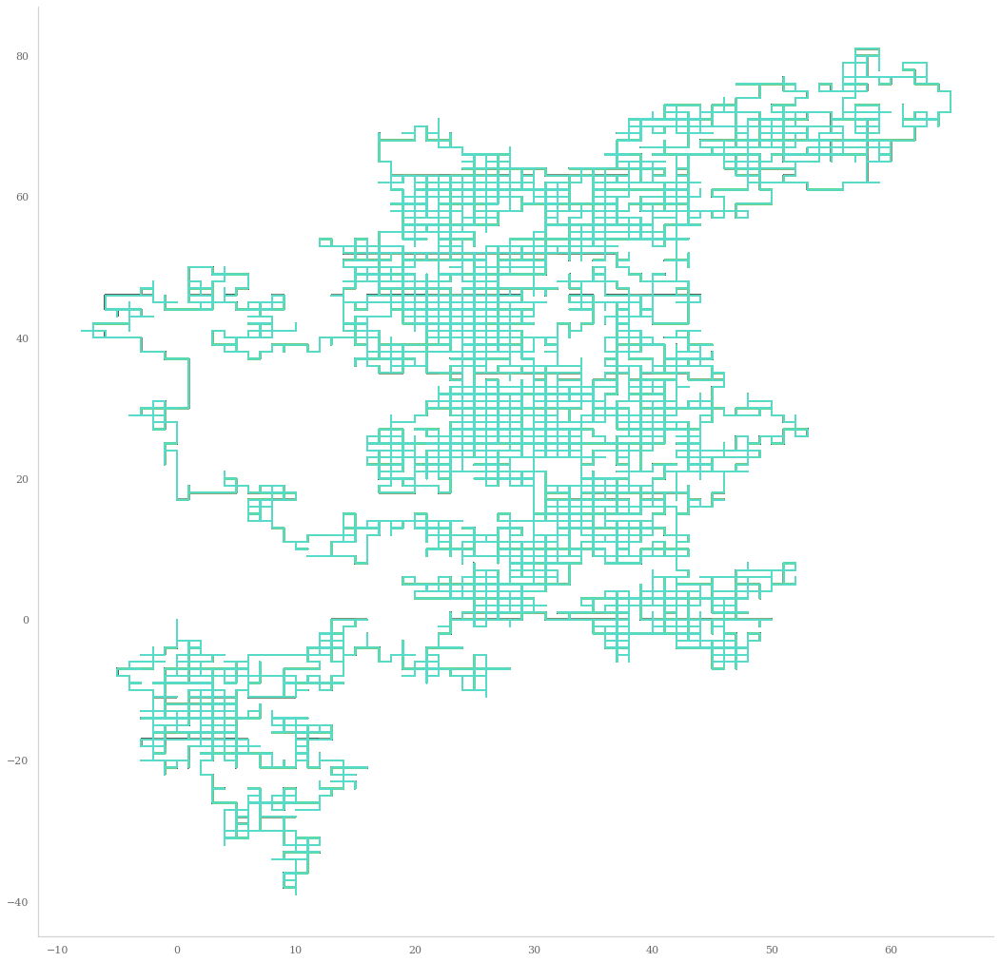

In [ ]:
plot_paths(paths, 500)

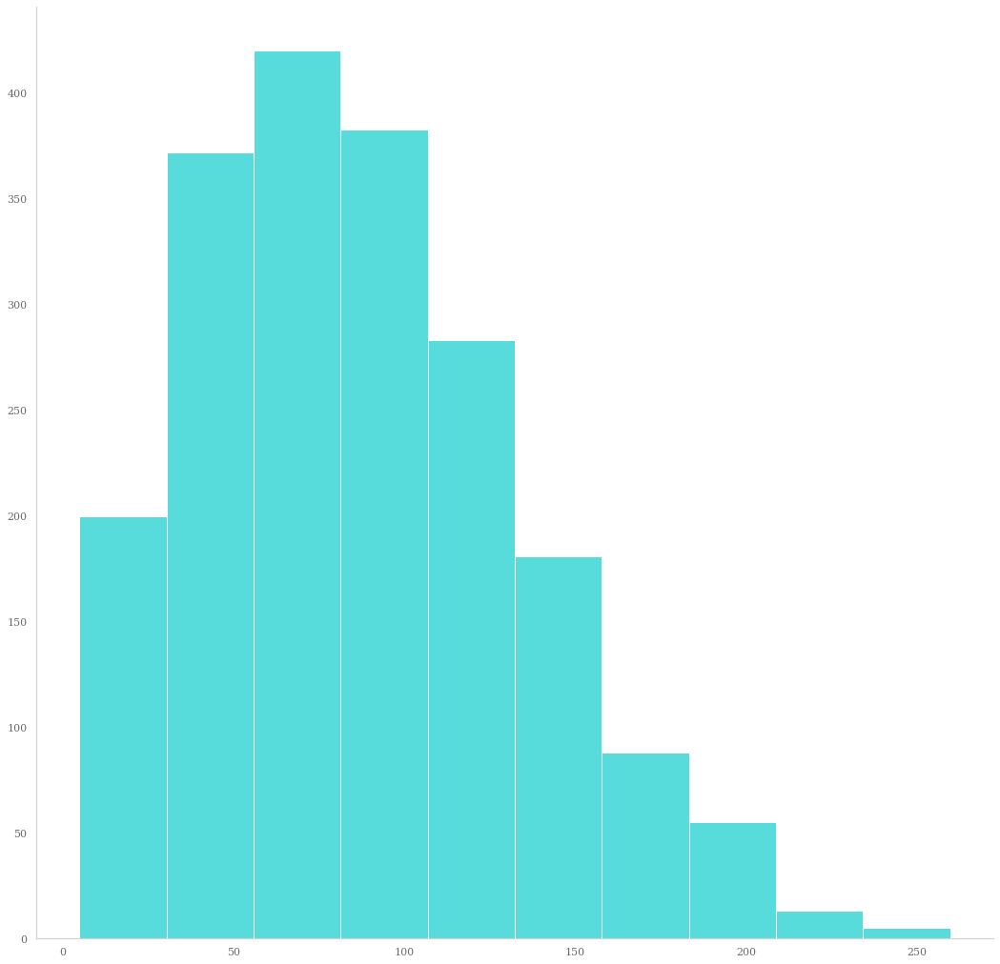

In [ ]:
plot_hist(distances)

In [ ]:
print(f"with (N={N}), the probability of an ant finding the food at {obj} with {n_movs} movements is: {sum(obj_found)/N}" )
print(f"with (N={N}), the probability of an ant coming back to the start at {start} after finding food at {obj} is: {sum(came_back)/N} ")

with (N=2000), the probability of an ant finding the food at [30 30] with 10000 movements is: 0.1165
with (N=2000), the probability of an ant coming back to the start at [0 0] after finding food at [30 30] is: 0.008 


In [ ]:
n_movs = 1000
N = 2000
obj = np.array((30,30))
start = np.array((0,0))
obj_found, came_back, distances, paths = random_walk(N, n_movs, obj)

In [ ]:
print(f"with (N={N}), the probability of an ant finding the food at {obj} with {n_movs} movements is: {sum(obj_found)/N}" )
print(f"with (N={N}), the probability of an ant coming back to the start at {start} after finding food at {obj} is: {sum(came_back)/N} ")

with (N=2000), the probability of an ant finding the food at [30 30] with 1000 movements is: 0.0045
with (N=2000), the probability of an ant coming back to the start at [0 0] after finding food at [30 30] is: 0.0 


In [ ]:
n_movs = 50000
N = 500
obj = np.array((30,30))
start = np.array((0,0))
obj_found, came_back, distances, paths = random_walk(N, n_movs, obj)

In [ ]:
print(f"with (N={N}), the probability of an ant finding the food at {obj} with {n_movs} movements is: {sum(obj_found)/N}" )
print(f"with (N={N}), the probability of an ant coming back to the start at {start} after finding food at {obj} is: {sum(came_back)/N} ")

with (N=500), the probability of an ant finding the food at [30 30] with 50000 movements is: 0.228
with (N=500), the probability of an ant coming back to the start at [0 0] after finding food at [30 30] is: 0.044 


In [ ]:
from IPython.display import clear_output
from matplotlib.animation import FuncAnimation
from tqdm import tqdm

In [ ]:
plt.rcParams["figure.figsize"] = (5,5)
from matplotlib import rc
rc('animation', html='jshtml')

In [ ]:


def simulate(N=50, cohesion=1, separation=1, alignment=1, radius=5, food=1, steps=1000, dim =2, fps=30, start_pos = None, food_rad = 15,
             food_pos = None, food_amount=30, max_speed = 5, collect_rad=3, obstacles=None, obstacle_radius=1, obstacle_degree = 0, obstacle_=1):
  t_obstacles = []
  for obstacle in obstacles:
      if type(obstacle) == list:
          t_obstacles.append(shapely.affinity.scale(shapely.geometry.Polygon(obstacle), 1.1, 1.1))
      else:
          t_obstacles.append(shapely.affinity.scale(obstacle, 1.1, 1.1))

  positions = []
  food_positions = []
  neighbour_mask = np.zeros((N,N,dim))

  C = np.zeros((N,dim)) #Cohesion force
  S = np.zeros((N,dim)) #Separation force
  A = np.zeros((N,dim)) #Alignment force
  V = np.zeros((N,dim)) #Velocity
  O = np.zeros((N,dim)) #Object avoidance force
  Food = np.zeros((N,dim))
  if not obstacles:
      obstacles = []
  if food_pos is None:
    food_pos = np.random.uniform(-80,80, (food_amount,dim))
  if start_pos is None:
    fish = np.random.uniform(0,10, (N, dim))
  else:
    fish=start_pos
  positions.append(fish)

  for step in tqdm(range(steps), position=0, leave=True):
    food_n_mask = np.zeros((N, food_amount, dim))
    food_collect_n_mask = np.zeros((N, food_amount, dim))
    for i in range(N): #optimize this..? symmetric mat, can (maybe) broadcast
      mask = np.linalg.norm(fish[i]-fish, axis=1)<radius
      food_mask = np.linalg.norm(fish[i]-food_pos, axis=1)<food_rad
      food_collect_mask = np.linalg.norm(fish[i]-food_pos, axis=1)>collect_rad








      neighbour_mask[i] = np.stack((mask,mask),-1)

      food_n_mask[i] = np.stack((food_mask,food_mask),-1)
      food_collect_n_mask[i] = np.stack((food_collect_mask,food_collect_mask),-1)

      neighbour_mask[i][i] = 0


      C[i] =   np.where(neighbour_mask[i], fish, 0).sum(axis=0)/max(sum(mask),1)-fish[i]

      S[i] = -np.where( neighbour_mask[i], (fish-fish[i]), 0).sum(axis=0)
      A[i] = np.where(neighbour_mask[i], V, 0).sum(axis=0)/max(sum(mask),1)-V[i]

      Food[i] = np.where(food_n_mask[i], food_pos, 0).sum(axis=0)/max(sum(mask),1)-fish[i]
      food_pos = np.where(food_collect_n_mask[i], food_pos, 99999)



    F = C*cohesion + S*separation + A*alignment + Food*food
    V += F/fps
    V = np.where(V<max_speed, V, max_speed)



    new_fish = fish+V
    for i in range(N):
     for obstacle in obstacles:
          polygon = obstacle
          p0 = shapely.Point(new_fish[i])
          if polygon.contains(p0):


              p1, p2 = shapely.ops.nearest_points(polygon, p0)

              t = (new_fish[i]-np.array((p1.x, p1.y)))*fps


              new_fish[i] = np.array((p1.x, p1.y))-np.array((V[i][0]*(1+np.cos(np.pi/2))-(V[i][1]*(1+np.sin(np.pi/2))), (V[i][1]*(1+np.cos(np.pi/2)))+(V[i][0]*(1+np.sin(np.pi/2)) )))-V[i]

          else:
              ...
              """ p1, p2 = shapely.ops.nearest_points(polygon, p0)
              t = -fish[i]-np.array((p1.x, p1.y))
              O[i] = t if np.linalg.norm(t)<obstacle_radius else 0 """


    fish = new_fish
    positions.append(fish)
    food_positions.append(food_pos)
  return positions, food_positions




In [ ]:

obstacles = [shapely.geometry.Polygon(((20,20), (40,20), (40,40), (20,40))),
             shapely.geometry.Polygon(((-20,-5), (-10,-20), (-10,-40), (-20,-60), (-40, -60), (-60, -40), (-60, -20), (-40, -5))),
             shapely.geometry.Polygon(((-35,15), (-15,15), (-50,30)))]

positions, food_pos = simulate(30, 0.05, 1, 0.05, radius=2, steps=1000, collect_rad=5, food_rad=50, obstacles = obstacles, food_amount=15)


100%|██████████| 1000/1000 [00:15<00:00, 64.74it/s]


302it [03:40,  1.37it/s]
301it [01:44,  3.10it/s]                         

302it [01:45,  2.41it/s]

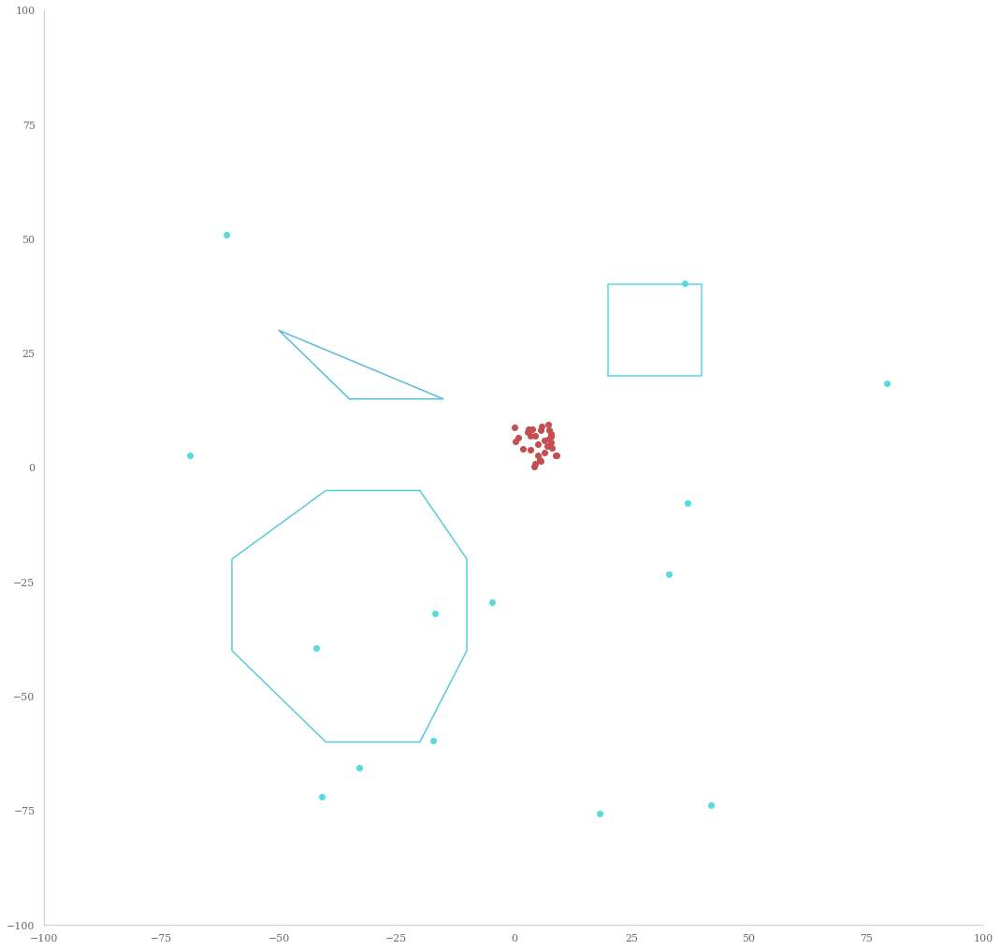

In [ ]:
n_frames = 300
pbar = tqdm(total=n_frames, position=0, leave=True)
x = np.linspace(0, 2*np.pi, 100)

fig, ax = plt.subplots()
scat = ax.scatter(positions[0][:,0], positions[0][:,1], color="r")
food_scat = ax.scatter(food_pos[0][:,0],food_pos[0][:,1])
for obstacle in obstacles:
    px,py = obstacle.exterior.xy
    obstacle = ax.plot(px,py)


ax.set_xlim(-100,100)
ax.set_ylim(-100,100)
def animate(frame_num):
    scat.set_offsets(positions[frame_num])
    food_scat.set_offsets(food_pos[frame_num])
    pbar.update(1)
    return scat
anim = FuncAnimation(fig,animate,frames=n_frames,interval=1)
anim

In [ ]:
anim.save("g.mp4")

603it [03:01,  7.11it/s]